In [1]:
import os
import sys
import numpy as np
import pandas as pd
import seaborn as sns
import ruptures as rpt
import matplotlib.pyplot as plt
sys.path.append('../../srcs')
import utils
import dataset

In [2]:
INPUT_DIR = '../../data/CMAPSSData'
turbofan_data = dataset.TurbofanData(INPUT_DIR)
turbofan_data.preprocess(normalize=False)

Datasets FD_001, FD_002, FD_003, FD_004 are loaded succesfully!
Finish calculating RUL in FD_001.
Finish calculating RUL in FD_002.
Finish calculating RUL in FD_003.
Finish calculating RUL in FD_004.


In [3]:
# FD_001
train1 = turbofan_data['FD_001']['df_train'].copy()

In [4]:
unit1 = train1.loc[train1['unit_number'] == 1]

In [5]:
res = rpt.Pelt().fit_predict(unit1['sensor_2'].values, pen=10)
print(res)

[120, 192]


In [6]:
changepoints = []
for unit_num in train1['unit_number'].unique():
    df_unit = train1.loc[train1['unit_number'] == unit_num]
    res = rpt.Pelt().fit_predict(df_unit['sensor_4'].values, pen=1500)
    print(len(df_unit) == res[0], res)
    changepoints.append(res[0])

False [150, 192]
False [180, 245, 287]
False [145, 179]
False [155, 189]
False [180, 235, 269]
False [140, 188]
False [160, 225, 259]
False [120, 150]
False [135, 180, 201]
False [125, 185, 222]
False [115, 190, 240]
False [125, 170]
False [130, 163]
False [120, 180]
False [130, 180, 207]
False [165, 209]
False [175, 235, 276]
False [160, 195]
False [110, 158]
False [155, 234]
False [140, 195]
False [150, 202]
False [120, 168]
False [110, 147]
False [175, 230]
False [145, 199]
False [120, 156]
False [125, 165]
False [75, 140, 163]
False [120, 170, 194]
False [115, 190, 234]
False [130, 191]
False [130, 170, 200]
False [150, 195]
False [150, 181]
False [120, 158]
False [120, 170]
False [145, 194]
False [95, 128]
False [140, 188]
False [145, 185, 216]
False [140, 196]
False [165, 207]
False [140, 192]
False [80, 130, 158]
False [155, 210, 256]
False [105, 185, 214]
False [190, 231]
False [130, 190, 215]
False [150, 198]
False [180, 213]
False [160, 213]
False [160, 195]
False [140, 210, 

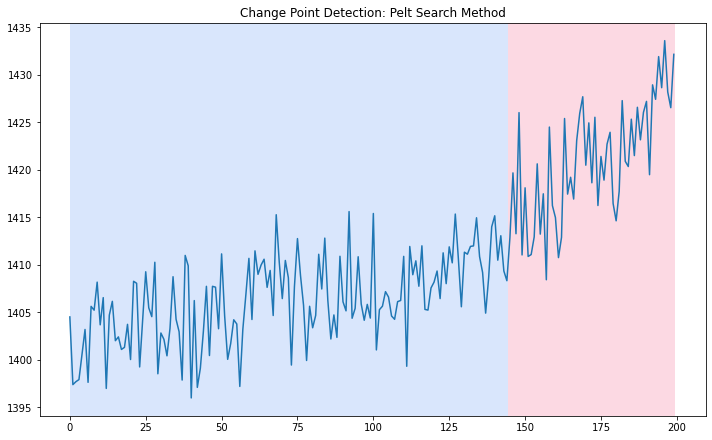

In [7]:
rpt.display(df_unit['sensor_4'].values, res, figsize=(10, 6))
plt.title('Change Point Detection: Pelt Search Method')
plt.show()  

In [8]:
def find_change_point(readings):
    # lower pernalty value, the more sensitive
    penalty_value = 3
    while penalty_value < 6000:
        res = rpt.Pelt().fit_predict(readings, pen=penalty_value)
        # return result if there is only 1 change point
        if len(res) <= 2:
            return res
        # else increase penalty value and find repeat finding
        penalty_value *= 1.2

    # return result even if there are more than 1 change points
    return res


def custom_plot(x, y, **kwargs):
    plt.plot(x, y, **kwargs)
    if 'markersize' in kwargs.keys():
        markersize = kwargs['markersize']
    else:
        markersize = None
    # plot changepoint
    changepoint = find_change_point(np.array(y))
    if len(changepoint) > 1:
        i = changepoint[0]
        plt.plot(x[i: i + 1], y[i: i + 1], 'o', color='red',
                 alpha=0.3, markersize=markersize)

In [9]:
res = find_change_point(unit1['sensor_2'].values)
print(res)

[120, 192]


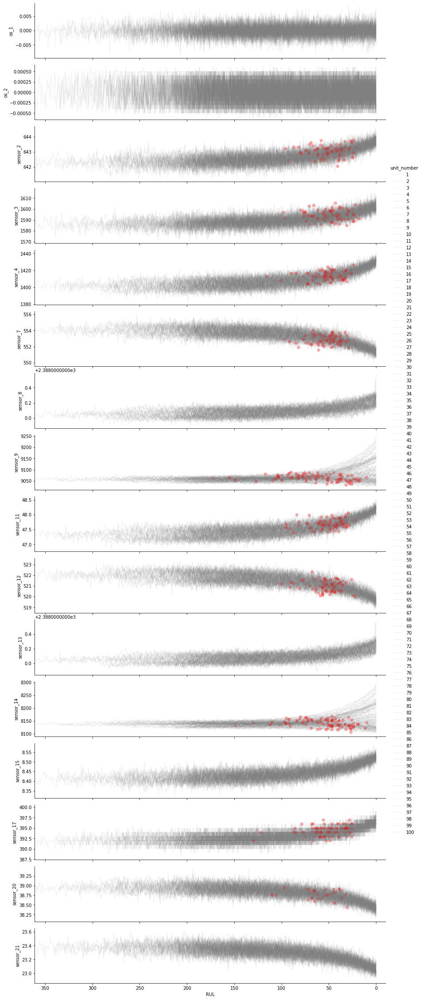

In [10]:
# FD_001
df = turbofan_data['FD_001']['df_train'].copy()
utils.plot_grouped_by_RUL(df, custom_plot, alpha=0.1)

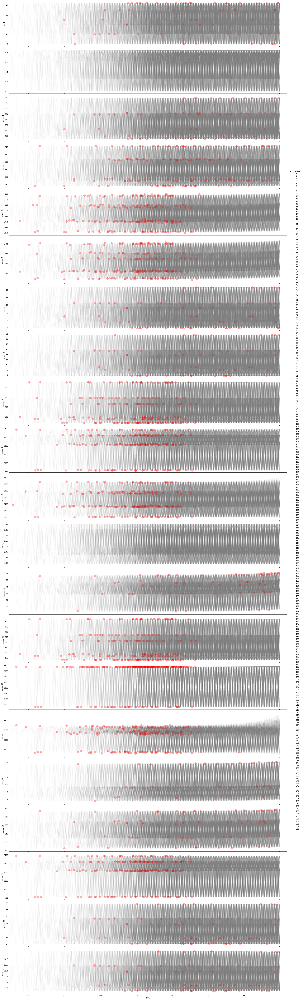

In [11]:
# FD_002
df = turbofan_data['FD_002']['df_train'].copy()
utils.plot_grouped_by_RUL(df, custom_plot, height=4, markersize=12)

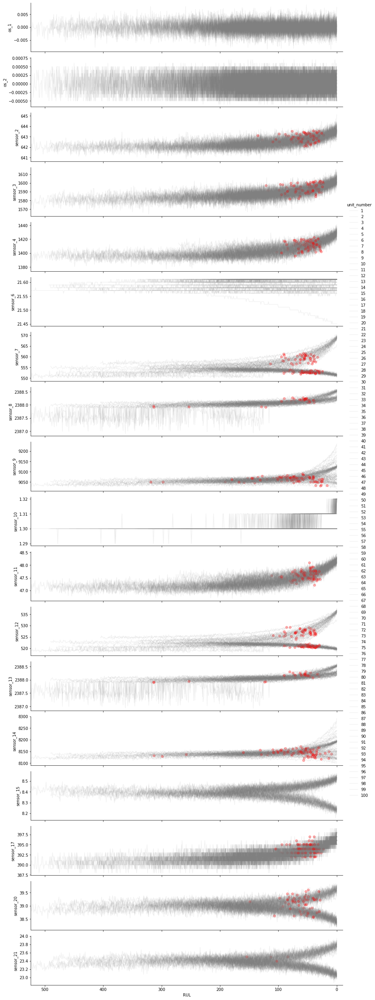

In [12]:
# FD_003
df = turbofan_data['FD_003']['df_train'].copy()
utils.plot_grouped_by_RUL(df, custom_plot, alpha=0.1)

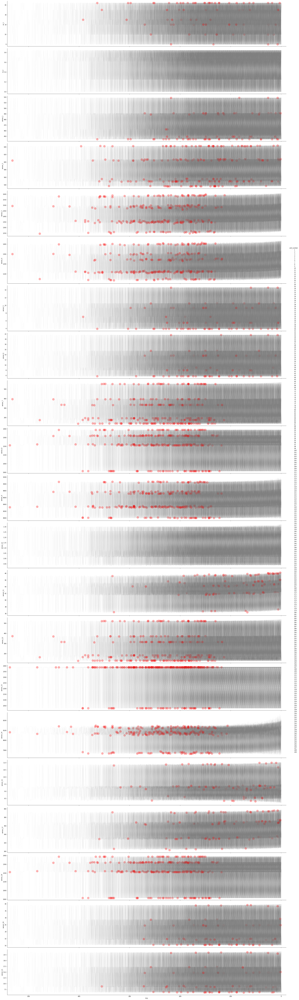

In [13]:
# FD_004
df = turbofan_data['FD_004']['df_train'].copy()
utils.plot_grouped_by_RUL(df, custom_plot, height=5, markersize=16)